In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import pandas_profiling

In [2]:
from __future__ import print_function
import os
data_path = ['data']

In [3]:
#filepath = os.sep.join(data_path +['X_Y_Sinusoid_Data.csv'])
data = pd.read_csv('https://raw.githubusercontent.com/reddyprasade/Data-Sets-For-Machine-Learnig-and-Data-Science/master/DataSets/X_Y_Sinusoid_Data.csv')
print(data)

           x         y
0   0.038571  0.066391
1   0.166776  1.027483
2   0.183153  1.245302
3   0.187359  1.004781
4   0.243116  1.264121
5   0.289299  0.498330
6   0.342805  0.597502
7   0.345499  0.629410
8   0.386477  0.822705
9   0.430047  0.557581
10  0.484498  0.565053
11  0.491929 -0.393222
12  0.614932 -0.912892
13  0.638054 -1.128250
14  0.697736 -1.110455
15  0.702427 -0.570343
16  0.729086 -0.620209
17  0.873401 -0.873236
18  0.898007 -0.187472
19  0.950964 -0.025815


In [4]:
data.head()

,x,y
0,0.038571,0.066391
1,0.166776,1.027483
2,0.183153,1.245302
3,0.187359,1.004781
4,0.243116,1.264121


In [5]:
data.tail()

,x,y
15,0.702427,-0.570343
16,0.729086,-0.620209
17,0.873401,-0.873236
18,0.898007,-0.187472
19,0.950964,-0.025815


In [6]:
data.shape

(20, 2)

In [7]:
data.ndim

2

In [8]:
data.mean()

x    0.484707
y    0.122838
dtype: float64

In [9]:
data.std()

x    0.267591
y    0.802220
dtype: float64

In [10]:
data.describe().T

,count,mean,std,min,25%,50%,75%,max
x,20.0,0.484707,0.267591,0.038571,0.277753,0.457273,0.698909,0.950964
y,20.0,0.122838,0.802220,-1.128250,-0.582809,0.282361,0.677734,1.264121


In [11]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20 entries, 0 to 19
Data columns (total 2 columns):
x    20 non-null float64
y    20 non-null float64
dtypes: float64(2)
memory usage: 448.0 bytes


In [12]:
from pandas_profiling import ProfileReport
pandas_profiling.ProfileReport(data)

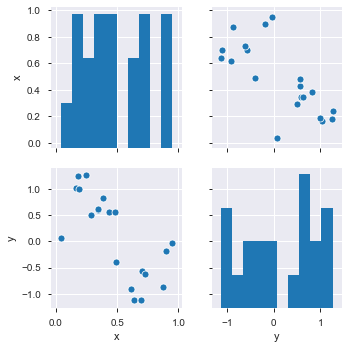

In [13]:
sns.pairplot(data)

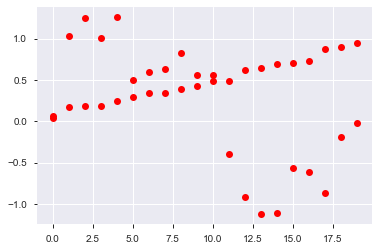

In [14]:
plt.plot(data,'ro')

In [15]:
X_real = np.linspace(0, 1.0, 100)
Y_real = np.sin(2*np.pi*X_real)

In [16]:
%matplotlib inline

[Text(0, 0.5, 'Y_data'), Text(0.5, 0, 'X_data')]

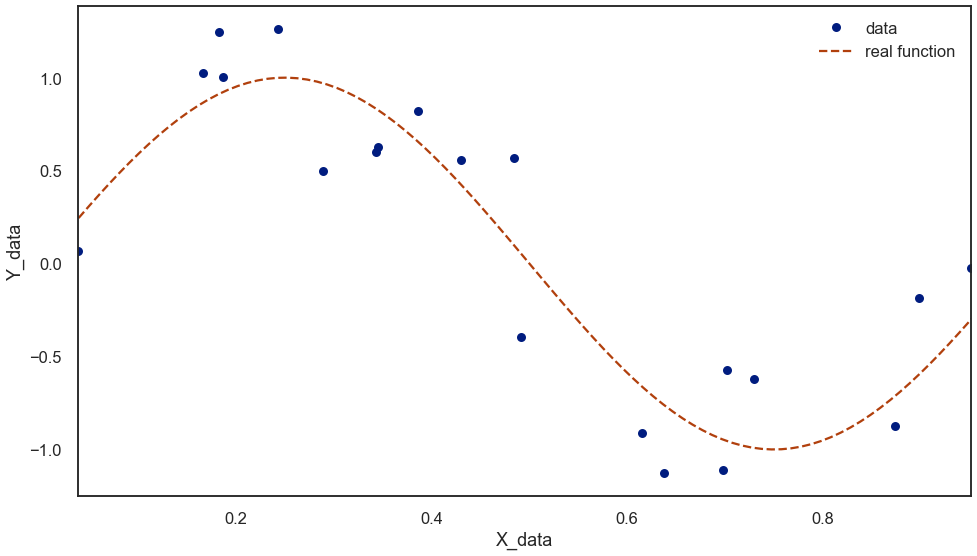

In [17]:
sns.set_style('white')
sns.set_context('talk')
sns.set_palette('dark')
plt.figure(figsize=(16,9))

ax = data.set_index('x')['y'].plot(ls='', marker='o',label='data')
ax.plot(X_real, Y_real, ls='--',marker='', label='real function')

ax.legend()
ax.set(Xlabel='X_data',Ylabel='Y_data')

In [18]:
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression

In [19]:
degree = 20
pf = PolynomialFeatures(degree)
lr = LinearRegression()
lr

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)

In [20]:
pf

PolynomialFeatures(degree=20, include_bias=True, interaction_only=False,
                   order='C')

In [21]:
X_data = data[['x']]
X_data.head(3)

,x
0,0.038571
1,0.166776
2,0.183153


In [22]:
Y_data= data['y']
Y_data.head(3)

0    0.066391
1    1.027483
2    1.245302
Name: y, dtype: float64

In [23]:
# create the features and fit the model
X_poly = pf.fit_transform(X_data)
X_poly[0:2]

array([[1.00000000e+00, 3.85709232e-02, 1.48771611e-03, 5.73825839e-05,
        2.21329923e-06, 8.53689947e-08, 3.29276094e-09, 1.27004829e-10,
        4.89869350e-12, 1.88947131e-13, 7.28786526e-15, 2.81099691e-16,
        1.08422746e-17, 4.18196540e-19, 1.61302266e-20, 6.22157731e-22,
        2.39971980e-23, 9.25594081e-25, 3.57010182e-26, 1.37702123e-27,
        5.31129800e-29],
       [1.00000000e+00, 1.66776347e-01, 2.78143498e-02, 4.63877563e-03,
        7.73638053e-04, 1.29024528e-04, 2.15182394e-05, 3.58873335e-06,
        5.98515837e-07, 9.98182846e-08, 1.66473288e-08, 2.77638068e-09,
        4.63034626e-10, 7.72232233e-11, 1.28790070e-11, 2.14791374e-12,
        3.58221207e-13, 5.97428241e-14, 9.96368994e-15, 1.66170781e-15,
        2.77133557e-16]])

In [24]:
pf.powers_

array([[ 0],
       [ 1],
       [ 2],
       [ 3],
       [ 4],
       [ 5],
       [ 6],
       [ 7],
       [ 8],
       [ 9],
       [10],
       [11],
       [12],
       [13],
       [14],
       [15],
       [16],
       [17],
       [18],
       [19],
       [20]], dtype=int64)

In [25]:
lr = lr.fit(X_poly, Y_data)
lr

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)

In [26]:
lr.coef_

array([-4.36611512e+12,  1.60664555e+07, -4.62521341e+08,  7.62426481e+09,
       -8.21382528e+10,  6.19277316e+11, -3.39510136e+12,  1.38099816e+13,
       -4.19215072e+13,  9.40147363e+13, -1.50116373e+14,  1.52965765e+14,
       -5.66426447e+13, -8.68698165e+13,  1.38856347e+14, -3.46614344e+13,
       -1.15408448e+14,  1.64272296e+14, -1.06220619e+14,  3.59301172e+13,
       -5.15761761e+12])

In [27]:
lr.intercept_

4366114885813.285

In [28]:
Y_pred = lr.predict(X_poly)
Y_pred[0:5]

array([0.06396484, 1.01855469, 1.2421875 , 1.00390625, 1.26171875])

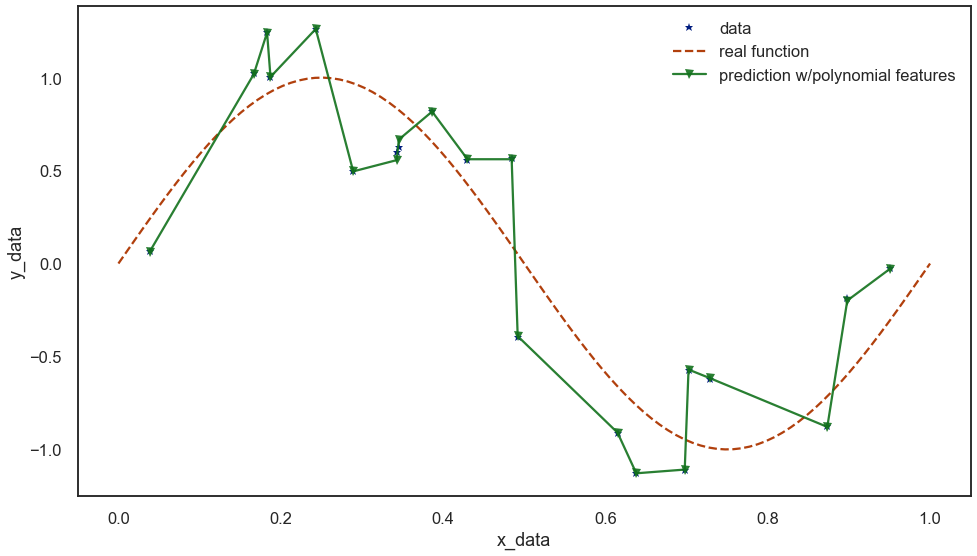

In [29]:
# Plot the result
plt.figure(figsize=(16,9))
plt.plot(X_data,Y_data, marker='*',ls='',label='data',alpha=1)  #Data
plt.plot(X_real,Y_real,ls='--',label='real function')  #Actual Prediction line
plt.plot(X_data,Y_pred,marker='v',alpha=.9,label='prediction w/polynomial features')  #Over fitting
plt.legend()
ax = plt.gca()
ax.set(xlabel='x_data',ylabel='y_data');

In [30]:
# perform regression on using rigid regression alpha(0.001) and lasso regression alpha(0.0001)

In [31]:
import warnings
warnings.filterwarnings('ignore', module='sklearn')

In [32]:
from sklearn.linear_model import Ridge, Lasso
# the ridge regression
rr = Ridge(alpha=0.01)
rr = rr.fit(X_poly, Y_data)
Y_pred_rr = rr.predict(X_poly)
Y_pred_rr[0:5]

array([0.81590797, 0.87774039, 0.87219167, 0.87023774, 0.82323006])

In [33]:
# the lasso regression
lassor = Lasso(alpha=0.0001)
lassor = lassor.fit(X_poly, Y_data)
Y_pred_lr = lassor.predict(X_poly)
Y_pred_lr

array([ 0.35126961,  0.9211695 ,  0.9494539 ,  0.95516874,  0.97317946,
        0.91161532,  0.76346518,  0.75404761,  0.59047931,  0.38096869,
        0.0838454 ,  0.04147324, -0.63473538, -0.73875111, -0.93532622,
       -0.94536262, -0.98459531, -0.57273313, -0.40214631, -0.00572072])

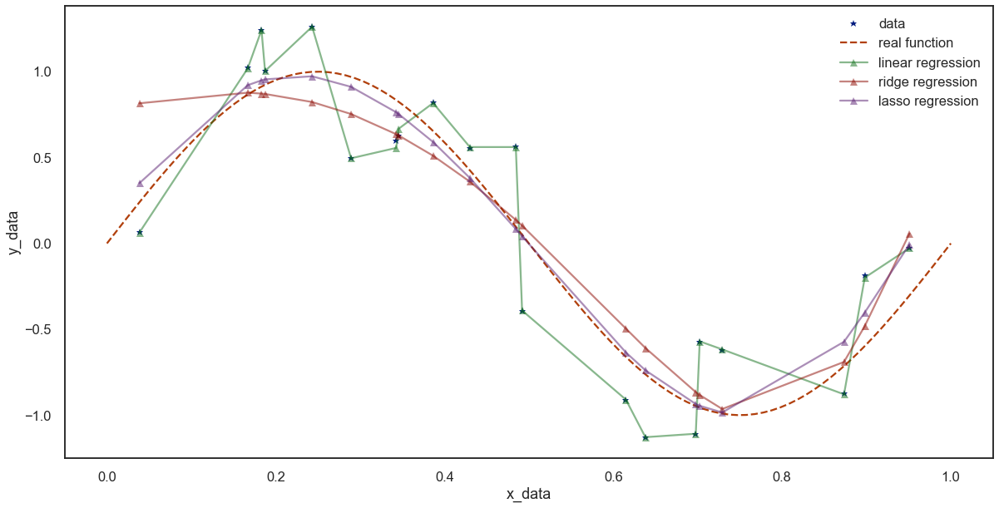

In [34]:
plt.figure(figsize=(20,10))
plt.plot(X_data,Y_data, marker='*',ls='',label='data',alpha=1)  #Data
plt.plot(X_real,Y_real,ls='--',label='real function')  #Actual Prediction line
plt.plot(X_data,Y_pred, label='linear regression', marker='^',alpha=.5)
plt.plot(X_data,Y_pred_rr, label='ridge regression', marker='^',alpha=.5)
plt.plot(X_data,Y_pred_lr, label='lasso regression', marker='^',alpha=.5)
plt.legend()
ax = plt.gca()
ax.set(xlabel='x_data',ylabel='y_data');

In [35]:
coefficients = pd.DataFrame()
coefficients['linear regression'] = lr.coef_.ravel()
coefficients['ridge regression'] = rr.coef_.ravel()
coefficients['lasso regression'] = lassor.coef_.ravel()
coefficients = coefficients.applymap(abs)
coefficients.head() # huge difference in scale between non-regularized vs regularized regression

,linear regression,ridge regression,lasso regression
0,4.366115e+12,0.000000,0.000000
1,1.606646e+07,1.518427,8.490500
2,4.625213e+08,4.535846,20.176708
3,7.624265e+09,2.860886,1.641353
4,8.213825e+10,0.602855,5.698488


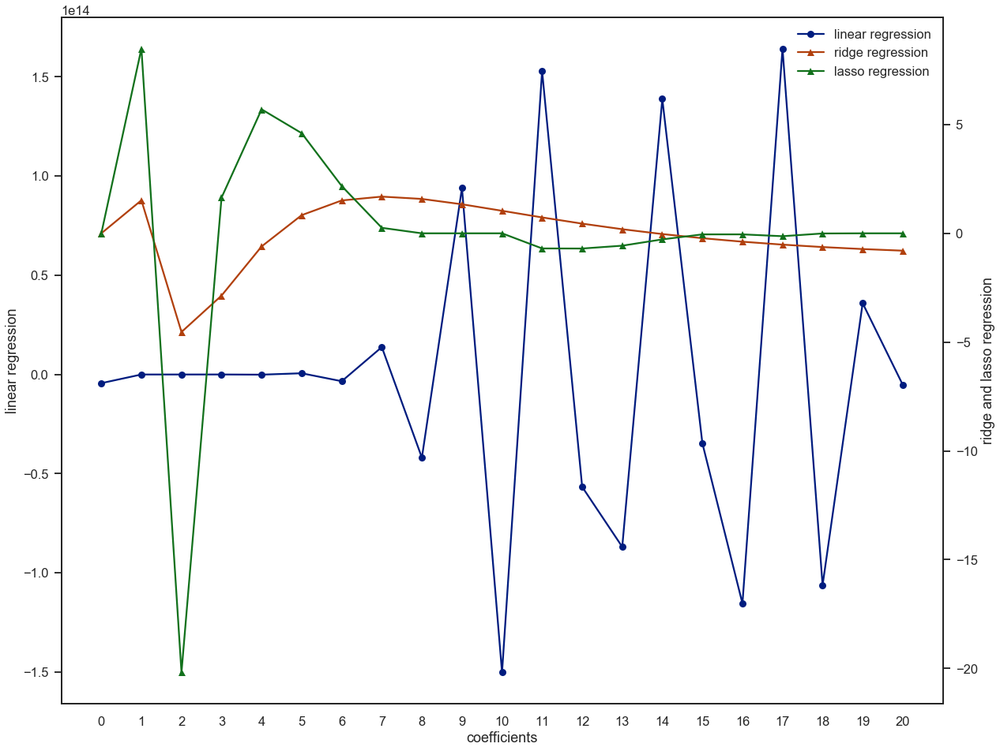

In [36]:
colors = sns.color_palette()
plt.figure(figsize=(20,16))
# setup dual y-axis
ax1 = plt.axes()
ax2 = ax1.twinx()
# plot the linear regression data
ax1.plot(lr.coef_.ravel(),
        color=colors[0], marker='o', label='linear regression')

#plot the regularization dataset
ax2.plot(rr.coef_.ravel(),
        color=colors[1], marker='^', label='ridge regression')

ax2.plot(lassor.coef_.ravel(),
        color=colors[2], marker='^', label='lasso regression')
# customize axes scales
#ax1.set_ylim(-2e14, 2e14)
#ax2.set_ylim(-25,25)

# combine the legeds
h1, l1 = ax1.get_legend_handles_labels() #lasso
h2, l2 = ax2.get_legend_handles_labels() #ridge
ax1.legend(h1+h2, l1+l2)

ax1.set(xlabel='coefficients', ylabel='linear regression')
ax2.set(ylabel='ridge and lasso regression')

ax1.set_xticks(range(len(lr.coef_)));

# Ames_Housing_Sales (05/01/2020)

In [2]:
Data = pd.read_csv('https://raw.githubusercontent.com/reddyprasade/Data-Sets-For-Machine-Learnig-and-Data-Science/master/DataSets/Ames_Housing_Sales.csv')

In [3]:
Data.head()

,1stFlrSF,2ndFlrSF,3SsnPorch,Alley,BedroomAbvGr,BldgType,BsmtCond,BsmtExposure,BsmtFinSF1,BsmtFinSF2,...,ScreenPorch,Street,TotRmsAbvGrd,TotalBsmtSF,Utilities,WoodDeckSF,YearBuilt,YearRemodAdd,YrSold,SalePrice
0,856.0,854.0,0.0,None,3,1Fam,TA,No,706.0,0.0,...,0.0,Pave,8,856.0,AllPub,0.0,2003,2003,2008,208500.0
1,1262.0,0.0,0.0,None,3,1Fam,TA,Gd,978.0,0.0,...,0.0,Pave,6,1262.0,AllPub,298.0,1976,1976,2007,181500.0
2,920.0,866.0,0.0,None,3,1Fam,TA,Mn,486.0,0.0,...,0.0,Pave,6,920.0,AllPub,0.0,2001,2002,2008,223500.0
3,961.0,756.0,0.0,None,3,1Fam,Gd,No,216.0,0.0,...,0.0,Pave,7,756.0,AllPub,0.0,1915,1970,2006,140000.0
4,1145.0,1053.0,0.0,None,4,1Fam,TA,Av,655.0,0.0,...,0.0,Pave,9,1145.0,AllPub,192.0,2000,2000,2008,250000.0


In [4]:
Data.tail()

,1stFlrSF,2ndFlrSF,3SsnPorch,Alley,BedroomAbvGr,BldgType,BsmtCond,BsmtExposure,BsmtFinSF1,BsmtFinSF2,...,ScreenPorch,Street,TotRmsAbvGrd,TotalBsmtSF,Utilities,WoodDeckSF,YearBuilt,YearRemodAdd,YrSold,SalePrice
1374,953.0,694.0,0.0,None,3,1Fam,None,None,0.0,0.0,...,0.0,Pave,7,953.0,AllPub,0.0,1999,2000,2007,175000.0
1375,2073.0,0.0,0.0,None,3,1Fam,TA,No,790.0,163.0,...,0.0,Pave,7,1542.0,AllPub,349.0,1978,1988,2010,210000.0
1376,1188.0,1152.0,0.0,None,4,1Fam,Gd,No,275.0,0.0,...,0.0,Pave,9,1152.0,AllPub,0.0,1941,2006,2010,266500.0
1377,1078.0,0.0,0.0,None,2,1Fam,TA,Mn,49.0,1029.0,...,0.0,Pave,5,1078.0,AllPub,366.0,1950,1996,2010,142125.0
1378,1256.0,0.0,0.0,None,3,1Fam,TA,No,830.0,290.0,...,0.0,Pave,6,1256.0,AllPub,736.0,1965,1965,2008,147500.0


In [5]:
Data.shape

(1379, 80)

In [6]:
Data.ndim

2

In [8]:
Data.mean()

1stFlrSF           1177.129804
2ndFlrSF            353.424946
3SsnPorch             3.609862
BedroomAbvGr          2.865120
BsmtFinSF1          455.578680
BsmtFinSF2           48.102248
BsmtFullBath          0.430747
BsmtHalfBath          0.058738
BsmtUnfSF           570.765047
EnclosedPorch        21.039159
Fireplaces            0.641769
FullBath              1.580131
GarageArea          500.762146
GarageCars            1.870921
GarageYrBlt        1978.506164
GrLivArea          1534.689630
HalfBath              0.395939
KitchenAbvGr          1.038434
LotArea           10695.812183
LotFrontage          75.112314
LowQualFinSF          4.134880
MSSubClass           56.022480
MasVnrArea          108.364757
MiscVal              42.889050
MoSold                6.334300
OpenPorchSF          47.276287
OverallCond           5.577955
OverallQual           6.187092
PoolArea              2.920957
ScreenPorch          15.945613
TotRmsAbvGrd          6.552574
TotalBsmtSF        1074.445975
WoodDeck

In [9]:
Data.describe().T

,count,mean,std,min,25%,50%,75%,max
1stFlrSF,1379.0,1177.129804,387.014961,438.0,894.0,1098.0,1414.0,4692.000000
2ndFlrSF,1379.0,353.424946,439.553171,0.0,0.0,0.0,738.5,2065.000000
3SsnPorch,1379.0,3.609862,30.154682,0.0,0.0,0.0,0.0,508.000000
BedroomAbvGr,1379.0,2.865120,0.783961,0.0,2.0,3.0,3.0,6.000000
BsmtFinSF1,1379.0,455.578680,459.691379,0.0,0.0,400.0,732.0,5644.000000
BsmtFinSF2,1379.0,48.102248,164.324665,0.0,0.0,0.0,0.0,1474.000000
BsmtFullBath,1379.0,0.430747,0.514052,0.0,0.0,0.0,1.0,2.000000
BsmtHalfBath,1379.0,0.058738,0.238285,0.0,0.0,0.0,0.0,2.000000
BsmtUnfSF,1379.0,570.765047,443.677845,0.0,228.0,476.0,811.0,2336.000000
EnclosedPorch,1379.0,21.039159,60.535107,0.0,0.0,0.0,0.0,552.000000


In [10]:
Data.cov().T

,1stFlrSF,2ndFlrSF,3SsnPorch,BedroomAbvGr,BsmtFinSF1,BsmtFinSF2,BsmtFullBath,BsmtHalfBath,BsmtUnfSF,EnclosedPorch,...,OverallQual,PoolArea,ScreenPorch,TotRmsAbvGrd,TotalBsmtSF,WoodDeckSF,YearBuilt,YearRemodAdd,YrSold,SalePrice
1stFlrSF,1.497806e+05,-3.805618e+04,620.856194,31.817956,7.945284e+04,5978.387299,50.028952,-0.059154,5.346942e+04,-1202.425987,...,243.452475,2120.540021,1794.222595,243.977568,1.389006e+05,1.107716e+04,2.935412e+03,1859.774396,-8.464717,1.819516e+07
2ndFlrSF,-3.805618e+04,1.932070e+05,-353.286197,174.906415,-2.888810e+04,-7702.602988,-39.316704,-2.255022,-1.257933e+03,1725.722099,...,169.245547,1494.365253,943.800342,427.823796,-3.784864e+04,5.006161e+03,2.214965e+02,1152.052273,-18.094295,1.088377e+07
3SsnPorch,6.208562e+02,-3.532862e+02,909.304866,-0.615069,3.313457e+02,-155.800429,-0.021232,0.255879,2.720628e+02,-67.469472,...,0.986688,-10.551905,-57.603237,-0.462783,4.476081e+02,-1.391018e+02,2.328720e+01,26.964501,0.781534,9.347404e+04
BedroomAbvGr,3.181796e+01,1.749064e+02,-0.615069,0.614595,-4.253800e+01,-0.996358,-0.063774,0.008654,5.171357e+01,2.452310,...,0.086211,2.457401,2.154488,0.830028,8.179210e+00,5.229299e+00,-1.653620e+00,-1.079878,-0.032608,1.020065e+04
BsmtFinSF1,7.945284e+04,-2.888810e+04,331.345668,-42.538001,2.113162e+05,-4152.046875,152.984226,6.665549,-1.025800e+05,-2692.119194,...,138.384398,2690.904990,1479.436430,32.440527,1.045841e+05,1.134154e+04,3.101491e+03,1077.687077,10.856225,1.364292e+07
BsmtFinSF2,5.978387e+03,-7.702603e+03,-155.800429,-0.996358,-4.152047e+03,27002.595488,13.464633,2.903279,-1.564214e+04,451.481479,...,-16.180247,281.682979,821.581762,-10.751751,7.208412e+03,1.317000e+03,-3.218100e+02,-261.442198,7.152019,-3.018225e+05
BsmtFullBath,5.002895e+01,-3.931670e+01,-0.021232,-0.063774,1.529842e+02,13.464633,0.264250,-0.018788,-9.701846e+01,-1.289739,...,0.075375,1.476743,0.622864,-0.041531,6.943040e+01,1.102731e+01,2.742056e+00,1.181097,0.046127,9.180180e+03
BsmtHalfBath,-5.915395e-02,-2.255022e+00,0.255879,0.008654,6.665549e+00,2.903279,-0.018788,0.056780,-1.017995e+01,-0.030604,...,-0.018254,0.199857,0.433531,-0.006356,-6.111205e-01,1.288821e+00,-3.785573e-01,-0.100321,-0.013633,-4.830105e+02
BsmtUnfSF,5.346942e+04,-1.257933e+03,272.062841,51.713569,-1.025800e+05,-15642.136336,-97.018460,-10.179948,1.968500e+05,40.243605,...,190.205093,-669.916263,-384.380712,164.367224,7.862789e+04,-2.991669e+02,2.053373e+03,1713.659631,-26.120358,7.472755e+06
EnclosedPorch,-1.202426e+03,1.725722e+03,-67.469472,2.452310,-2.692119e+03,451.481479,-1.289739,-0.030604,4.024360e+01,3664.499191,...,-8.685126,143.598163,-284.387564,0.378927,-2.200394e+03,-9.746463e+02,-6.733982e+02,-260.931419,-0.424425,-5.748330e+05


In [11]:
Data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1379 entries, 0 to 1378
Data columns (total 80 columns):
1stFlrSF         1379 non-null float64
2ndFlrSF         1379 non-null float64
3SsnPorch        1379 non-null float64
Alley            1379 non-null object
BedroomAbvGr     1379 non-null int64
BldgType         1379 non-null object
BsmtCond         1379 non-null object
BsmtExposure     1379 non-null object
BsmtFinSF1       1379 non-null float64
BsmtFinSF2       1379 non-null float64
BsmtFinType1     1379 non-null object
BsmtFinType2     1379 non-null object
BsmtFullBath     1379 non-null int64
BsmtHalfBath     1379 non-null int64
BsmtQual         1379 non-null object
BsmtUnfSF        1379 non-null float64
CentralAir       1379 non-null object
Condition1       1379 non-null object
Condition2       1379 non-null object
Electrical       1379 non-null object
EnclosedPorch    1379 non-null float64
ExterCond        1379 non-null object
ExterQual        1379 non-null object
Exterior1st    

In [12]:
from pandas_profiling import ProfileReport
pandas_profiling.ProfileReport(Data)

In [13]:
# Get a pd.series consisting of all the string categoricals
one_hot_encode_cols = Data.dtypes[Data.dtypes == np.object] #filitering by string categoricals
one_hot_encode_cols = one_hot_encode_cols.index.tolist()  # list of categorical field
one_hot_encode_cols

['Alley',
 'BldgType',
 'BsmtCond',
 'BsmtExposure',
 'BsmtFinType1',
 'BsmtFinType2',
 'BsmtQual',
 'CentralAir',
 'Condition1',
 'Condition2',
 'Electrical',
 'ExterCond',
 'ExterQual',
 'Exterior1st',
 'Exterior2nd',
 'Fence',
 'FireplaceQu',
 'Foundation',
 'Functional',
 'GarageCond',
 'GarageFinish',
 'GarageQual',
 'GarageType',
 'Heating',
 'HeatingQC',
 'HouseStyle',
 'KitchenQual',
 'LandContour',
 'LandSlope',
 'LotConfig',
 'LotShape',
 'MSZoning',
 'MasVnrType',
 'MiscFeature',
 'Neighborhood',
 'PavedDrive',
 'PoolQC',
 'RoofMatl',
 'RoofStyle',
 'SaleCondition',
 'SaleType',
 'Street',
 'Utilities']

In [14]:
for col in one_hot_encode_cols:
    Data[col] = pd.Categorical(Data[col])

In [15]:
Data = pd.get_dummies(Data, columns=one_hot_encode_cols)
Data

,1stFlrSF,2ndFlrSF,3SsnPorch,BedroomAbvGr,BsmtFinSF1,BsmtFinSF2,BsmtFullBath,BsmtHalfBath,BsmtUnfSF,EnclosedPorch,...,SaleType_ConLD,SaleType_ConLI,SaleType_ConLw,SaleType_New,SaleType_Oth,SaleType_WD,Street_Grvl,Street_Pave,Utilities_AllPub,Utilities_NoSeWa
0,856.0,854.0,0.0,3,706.0,0.0,1,0,150.0,0.0,...,0,0,0,0,0,1,0,1,1,0
1,1262.0,0.0,0.0,3,978.0,0.0,0,1,284.0,0.0,...,0,0,0,0,0,1,0,1,1,0
2,920.0,866.0,0.0,3,486.0,0.0,1,0,434.0,0.0,...,0,0,0,0,0,1,0,1,1,0
3,961.0,756.0,0.0,3,216.0,0.0,1,0,540.0,272.0,...,0,0,0,0,0,1,0,1,1,0
4,1145.0,1053.0,0.0,4,655.0,0.0,1,0,490.0,0.0,...,0,0,0,0,0,1,0,1,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1374,953.0,694.0,0.0,3,0.0,0.0,0,0,953.0,0.0,...,0,0,0,0,0,1,0,1,1,0
1375,2073.0,0.0,0.0,3,790.0,163.0,1,0,589.0,0.0,...,0,0,0,0,0,1,0,1,1,0
1376,1188.0,1152.0,0.0,4,275.0,0.0,0,0,877.0,0.0,...,0,0,0,0,0,1,0,1,1,0
1377,1078.0,0.0,0.0,2,49.0,1029.0,1,0,0.0,112.0,...,0,0,0,0,0,1,0,1,1,0


In [16]:
# Next split the data in train and test data sets

In [17]:
from sklearn.model_selection import train_test_split
train, test = train_test_split(Data, test_size=0.3, random_state=42)

In [18]:
train.shape

(965, 295)

In [19]:
test.shape

(414, 295)

In [20]:
# Create a list of float columns t check for skewing
mask = Data.dtypes == np.float
float_cols = Data.columns[mask]
float_cols

Index(['1stFlrSF', '2ndFlrSF', '3SsnPorch', 'BsmtFinSF1', 'BsmtFinSF2',
       'BsmtUnfSF', 'EnclosedPorch', 'GarageArea', 'GarageYrBlt', 'GrLivArea',
       'LotArea', 'LotFrontage', 'LowQualFinSF', 'MasVnrArea', 'MiscVal',
       'OpenPorchSF', 'PoolArea', 'ScreenPorch', 'TotalBsmtSF', 'WoodDeckSF',
       'SalePrice'],
      dtype='object')

In [21]:
skew_limit = 0.75
skew_vals = train[float_cols].skew()

skew_cols = (skew_vals
            .sort_values(ascending=False)
            .to_frame()
            .rename(columns={0:'skew'})
            .query('abs(skew)> {0}'.format(skew_limit)))
skew_cols

,skew
MiscVal,26.915364
PoolArea,15.777668
LotArea,11.501694
LowQualFinSF,11.210638
3SsnPorch,10.150612
ScreenPorch,4.599803
BsmtFinSF2,4.466378
EnclosedPorch,3.218303
LotFrontage,3.138032
MasVnrArea,2.492814


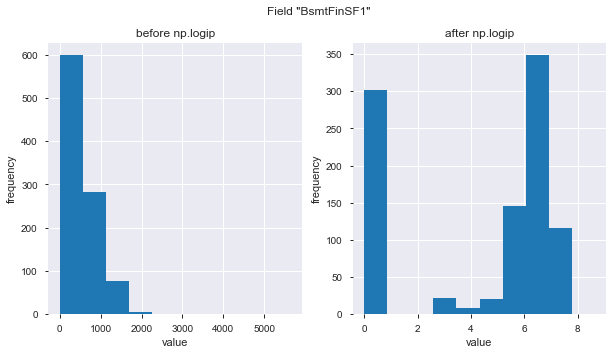

In [22]:
# OPTIONAL: lets look at what happens to one of these features

field = 'BsmtFinSF1'
fig,(ax_before, ax_after)= plt.subplots(1, 2, figsize=(10,5))
train[field].hist(ax=ax_before)
train[field].apply(np.log1p).hist(ax=ax_after)
ax_before.set(title='before np.logip', ylabel='frequency', xlabel='value')
ax_after.set(title='after np.logip', ylabel='frequency', xlabel='value')
fig.suptitle('Field "{}"'.format(field));
             

In [23]:
# Mute the settings with a copy warnings
pd.options.mode.chained_assignment = None

for col in skew_cols.index.tolist():
    if col == "SalePrice":
        continue
    train[col] = np.log1p(train[col])
    test[col] = test[col].apply(np.log1p) # same thing, saleprice is taken in test[col]

In [24]:
train[0:5]

,1stFlrSF,2ndFlrSF,3SsnPorch,BedroomAbvGr,BsmtFinSF1,BsmtFinSF2,BsmtFullBath,BsmtHalfBath,BsmtUnfSF,EnclosedPorch,...,SaleType_ConLD,SaleType_ConLI,SaleType_ConLw,SaleType_New,SaleType_Oth,SaleType_WD,Street_Grvl,Street_Pave,Utilities_AllPub,Utilities_NoSeWa
461,6.447306,0.000000,0.0,1,6.246107,0.0,1,0,4.753590,0.0,...,0,0,0,0,0,1,0,1,1,0
976,6.740519,0.000000,0.0,3,0.000000,0.0,0,0,0.000000,0.0,...,0,0,0,0,0,1,0,1,1,0
1128,6.591674,6.591674,0.0,3,0.000000,0.0,0,0,6.591674,0.0,...,0,0,0,0,0,1,0,1,1,0
904,6.331502,6.505784,0.0,2,5.655992,0.0,0,0,5.624018,0.0,...,0,0,0,0,0,1,0,1,1,0
506,7.379008,0.000000,0.0,3,7.214504,0.0,1,0,5.411646,0.0,...,0,0,0,0,0,1,0,1,1,0


In [25]:
test[0:5]

,1stFlrSF,2ndFlrSF,3SsnPorch,BedroomAbvGr,BsmtFinSF1,BsmtFinSF2,BsmtFullBath,BsmtHalfBath,BsmtUnfSF,EnclosedPorch,...,SaleType_ConLD,SaleType_ConLI,SaleType_ConLw,SaleType_New,SaleType_Oth,SaleType_WD,Street_Grvl,Street_Pave,Utilities_AllPub,Utilities_NoSeWa
599,7.325808,0.000000,0.0,1,7.105786,0.000000,0,0,5.707110,0.00000,...,0,0,0,0,0,1,0,1,1,0
881,6.830874,0.000000,0.0,2,5.826000,6.146329,0,1,4.804021,0.00000,...,0,0,0,0,0,1,0,1,1,0
634,6.999422,6.522093,0.0,4,0.000000,0.000000,1,0,6.999422,4.51086,...,0,0,0,0,0,1,0,1,1,0
425,6.790097,6.767343,0.0,3,6.610696,0.000000,1,0,4.875197,0.00000,...,0,0,0,0,0,1,0,1,1,0
906,7.198931,0.000000,0.0,3,6.551080,0.000000,1,0,6.459904,0.00000,...,0,0,0,0,0,1,0,1,1,0


In [26]:
feature_cols = [x for x in train.columns if x != 'SalePrice']
X_train = train[feature_cols]
X_train.shape

(965, 294)

In [27]:
y_train = train['SalePrice']
X_test = test[feature_cols]
y_test = test['SalePrice']

In [28]:
from sklearn.metrics import mean_squared_error
def rmse(ytrue, ypredicted):
    return np.sqrt(mean_squared_error(ytrue, ypredicted))

In [29]:
from sklearn.linear_model import LinearRegression
linearRegression = LinearRegression().fit(X_train, y_train)
linearRegression

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)

In [30]:
y_predict = linearRegression.predict(X_test)

In [31]:
rmse(y_test,y_predict)

306369.68342319375

In [32]:
linearRegression_rmse = rmse(y_test, linearRegression.predict(X_test))
print(linearRegression_rmse)

306369.68342319375


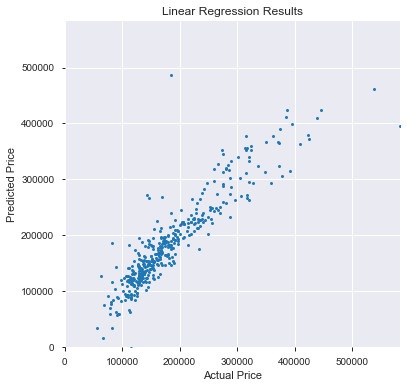

In [33]:
f = plt.figure(figsize=(6,6))
ax = plt.axes()
ax.plot(y_test, linearRegression.predict(X_test), marker='o', ls='', ms=3.0)
lim = (0, y_test.max())
ax.set(xlabel='Actual Price',
      ylabel='Predicted Price',
      xlim=lim,
      ylim=lim,
      title='Linear Regression Results');

# Ridge regression 

In [34]:
from sklearn.linear_model import RidgeCV
alphas = [0.005, 0.05, 0.1, 0.3, 1, 3, 5, 10, 15, 30, 80]
ridgeCV = RidgeCV(alphas=alphas,
                 cv=4).fit(X_train, y_train)
ridgeCV_rmse = rmse(y_test, ridgeCV.predict(X_test))
print(ridgeCV.alpha_, ridgeCV_rmse)

15.0 32169.176205672447


# Lasso regression

In [35]:
from sklearn.linear_model import LassoCV
alphas2 = np.array([1e-5, 5e-5, 0.0001, 0.0005])
lassoCV = LassoCV(alphas= alphas2,
                 max_iter=5e4,
                 cv=3).fit(X_train, y_train)
lassoCV_rmse = rmse(y_test, lassoCV.predict(X_test))
print(lassoCV.alpha_, lassoCV_rmse)

0.0005 39257.393991446304


In [36]:
print('Of {} coefficients, {} are non-zero with Lasso.'.format(len(lassoCV.coef_),
                                                              len(lassoCV.coef_.nonzero()[0])))

Of 294 coefficients, 274 are non-zero with Lasso.


In [37]:
from sklearn.linear_model import ElasticNetCV

In [75]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from sklearn.datasets import load_boston
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Ridge,Lasso

In [76]:
boston=load_boston()
boston.data

array([[6.3200e-03, 1.8000e+01, 2.3100e+00, ..., 1.5300e+01, 3.9690e+02,
        4.9800e+00],
       [2.7310e-02, 0.0000e+00, 7.0700e+00, ..., 1.7800e+01, 3.9690e+02,
        9.1400e+00],
       [2.7290e-02, 0.0000e+00, 7.0700e+00, ..., 1.7800e+01, 3.9283e+02,
        4.0300e+00],
       ...,
       [6.0760e-02, 0.0000e+00, 1.1930e+01, ..., 2.1000e+01, 3.9690e+02,
        5.6400e+00],
       [1.0959e-01, 0.0000e+00, 1.1930e+01, ..., 2.1000e+01, 3.9345e+02,
        6.4800e+00],
       [4.7410e-02, 0.0000e+00, 1.1930e+01, ..., 2.1000e+01, 3.9690e+02,
        7.8800e+00]])

In [77]:
print(boston.DESCR)

.. _boston_dataset:

Boston house prices dataset
---------------------------

**Data Set Characteristics:**  

    :Number of Instances: 506 

    :Number of Attributes: 13 numeric/categorical predictive. Median Value (attribute 14) is usually the target.

    :Attribute Information (in order):
        - CRIM     per capita crime rate by town
        - ZN       proportion of residential land zoned for lots over 25,000 sq.ft.
        - INDUS    proportion of non-retail business acres per town
        - CHAS     Charles River dummy variable (= 1 if tract bounds river; 0 otherwise)
        - NOX      nitric oxides concentration (parts per 10 million)
        - RM       average number of rooms per dwelling
        - AGE      proportion of owner-occupied units built prior to 1940
        - DIS      weighted distances to five Boston employment centres
        - RAD      index of accessibility to radial highways
        - TAX      full-value property-tax rate per $10,000
        - PTRATIO  pu

In [78]:
boston.target

array([24. , 21.6, 34.7, 33.4, 36.2, 28.7, 22.9, 27.1, 16.5, 18.9, 15. ,
       18.9, 21.7, 20.4, 18.2, 19.9, 23.1, 17.5, 20.2, 18.2, 13.6, 19.6,
       15.2, 14.5, 15.6, 13.9, 16.6, 14.8, 18.4, 21. , 12.7, 14.5, 13.2,
       13.1, 13.5, 18.9, 20. , 21. , 24.7, 30.8, 34.9, 26.6, 25.3, 24.7,
       21.2, 19.3, 20. , 16.6, 14.4, 19.4, 19.7, 20.5, 25. , 23.4, 18.9,
       35.4, 24.7, 31.6, 23.3, 19.6, 18.7, 16. , 22.2, 25. , 33. , 23.5,
       19.4, 22. , 17.4, 20.9, 24.2, 21.7, 22.8, 23.4, 24.1, 21.4, 20. ,
       20.8, 21.2, 20.3, 28. , 23.9, 24.8, 22.9, 23.9, 26.6, 22.5, 22.2,
       23.6, 28.7, 22.6, 22. , 22.9, 25. , 20.6, 28.4, 21.4, 38.7, 43.8,
       33.2, 27.5, 26.5, 18.6, 19.3, 20.1, 19.5, 19.5, 20.4, 19.8, 19.4,
       21.7, 22.8, 18.8, 18.7, 18.5, 18.3, 21.2, 19.2, 20.4, 19.3, 22. ,
       20.3, 20.5, 17.3, 18.8, 21.4, 15.7, 16.2, 18. , 14.3, 19.2, 19.6,
       23. , 18.4, 15.6, 18.1, 17.4, 17.1, 13.3, 17.8, 14. , 14.4, 13.4,
       15.6, 11.8, 13.8, 15.6, 14.6, 17.8, 15.4, 21

In [81]:
boston.filename

'c:\\users\\praveen1981\\appdata\\local\\programs\\python\\python37\\lib\\site-packages\\sklearn\\datasets\\data\\boston_house_prices.csv'

In [82]:
boston_df=pd.DataFrame(boston.data, columns=boston.feature_names)
boston_df.head()

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT
0,0.00632,18.0,2.31,0.0,0.538,6.575,65.2,4.0900,1.0,296.0,15.3,396.90,4.98
1,0.02731,0.0,7.07,0.0,0.469,6.421,78.9,4.9671,2.0,242.0,17.8,396.90,9.14
2,0.02729,0.0,7.07,0.0,0.469,7.185,61.1,4.9671,2.0,242.0,17.8,392.83,4.03
3,0.03237,0.0,2.18,0.0,0.458,6.998,45.8,6.0622,3.0,222.0,18.7,394.63,2.94
4,0.06905,0.0,2.18,0.0,0.458,7.147,54.2,6.0622,3.0,222.0,18.7,396.90,5.33


In [83]:
boston_df.tail()

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT
501,0.06263,0.0,11.93,0.0,0.573,6.593,69.1,2.4786,1.0,273.0,21.0,391.99,9.67
502,0.04527,0.0,11.93,0.0,0.573,6.120,76.7,2.2875,1.0,273.0,21.0,396.90,9.08
503,0.06076,0.0,11.93,0.0,0.573,6.976,91.0,2.1675,1.0,273.0,21.0,396.90,5.64
504,0.10959,0.0,11.93,0.0,0.573,6.794,89.3,2.3889,1.0,273.0,21.0,393.45,6.48
505,0.04741,0.0,11.93,0.0,0.573,6.030,80.8,2.5050,1.0,273.0,21.0,396.90,7.88


In [84]:
boston_df.describe()

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT
count,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000
mean,3.613524,11.363636,11.136779,0.069170,0.554695,6.284634,68.574901,3.795043,9.549407,408.237154,18.455534,356.674032,12.653063
std,8.601545,23.322453,6.860353,0.253994,0.115878,0.702617,28.148861,2.105710,8.707259,168.537116,2.164946,91.294864,7.141062
min,0.006320,0.000000,0.460000,0.000000,0.385000,3.561000,2.900000,1.129600,1.000000,187.000000,12.600000,0.320000,1.730000
25%,0.082045,0.000000,5.190000,0.000000,0.449000,5.885500,45.025000,2.100175,4.000000,279.000000,17.400000,375.377500,6.950000
50%,0.256510,0.000000,9.690000,0.000000,0.538000,6.208500,77.500000,3.207450,5.000000,330.000000,19.050000,391.440000,11.360000
75%,3.677083,12.500000,18.100000,0.000000,0.624000,6.623500,94.075000,5.188425,24.000000,666.000000,20.200000,396.225000,16.955000
max,88.976200,100.000000,27.740000,1.000000,0.871000,8.780000,100.000000,12.126500,24.000000,711.000000,22.000000,396.900000,37.970000


In [85]:
import pandas_profiling
pandas_profiling.ProfileReport(boston_df)

In [86]:
# add anther column that contain the house price which in scikit learn datasets are considered as target

In [87]:
boston_df['Price']=boston.target
print(boston_df.head(3))

      CRIM    ZN  INDUS  CHAS    NOX     RM   AGE     DIS  RAD    TAX  \
0  0.00632  18.0   2.31   0.0  0.538  6.575  65.2  4.0900  1.0  296.0   
1  0.02731   0.0   7.07   0.0  0.469  6.421  78.9  4.9671  2.0  242.0   
2  0.02729   0.0   7.07   0.0  0.469  7.185  61.1  4.9671  2.0  242.0   

   PTRATIO       B  LSTAT  Price  
0     15.3  396.90   4.98   24.0  
1     17.8  396.90   9.14   21.6  
2     17.8  392.83   4.03   34.7  


In [88]:
boston_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 506 entries, 0 to 505
Data columns (total 14 columns):
CRIM       506 non-null float64
ZN         506 non-null float64
INDUS      506 non-null float64
CHAS       506 non-null float64
NOX        506 non-null float64
RM         506 non-null float64
AGE        506 non-null float64
DIS        506 non-null float64
RAD        506 non-null float64
TAX        506 non-null float64
PTRATIO    506 non-null float64
B          506 non-null float64
LSTAT      506 non-null float64
Price      506 non-null float64
dtypes: float64(14)
memory usage: 55.5 KB


In [89]:
boston_df.head()

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,Price
0,0.00632,18.0,2.31,0.0,0.538,6.575,65.2,4.0900,1.0,296.0,15.3,396.90,4.98,24.0
1,0.02731,0.0,7.07,0.0,0.469,6.421,78.9,4.9671,2.0,242.0,17.8,396.90,9.14,21.6
2,0.02729,0.0,7.07,0.0,0.469,7.185,61.1,4.9671,2.0,242.0,17.8,392.83,4.03,34.7
3,0.03237,0.0,2.18,0.0,0.458,6.998,45.8,6.0622,3.0,222.0,18.7,394.63,2.94,33.4
4,0.06905,0.0,2.18,0.0,0.458,7.147,54.2,6.0622,3.0,222.0,18.7,396.90,5.33,36.2


In [90]:
newX = boston_df.drop('Price',axis=1)
print(newX[0:3])

      CRIM    ZN  INDUS  CHAS    NOX     RM   AGE     DIS  RAD    TAX  \
0  0.00632  18.0   2.31   0.0  0.538  6.575  65.2  4.0900  1.0  296.0   
1  0.02731   0.0   7.07   0.0  0.469  6.421  78.9  4.9671  2.0  242.0   
2  0.02729   0.0   7.07   0.0  0.469  7.185  61.1  4.9671  2.0  242.0   

   PTRATIO       B  LSTAT  
0     15.3  396.90   4.98  
1     17.8  396.90   9.14  
2     17.8  392.83   4.03  


In [91]:
newY = boston_df['Price']
print(newY)

0      24.0
1      21.6
2      34.7
3      33.4
4      36.2
       ... 
501    22.4
502    20.6
503    23.9
504    22.0
505    11.9
Name: Price, Length: 506, dtype: float64


In [93]:
X_train,X_test,y_train,y_test=train_test_split(newX,newY,test_size=0.2,random_state=3)
print(len(X_test), len(y_test))

102 102


In [94]:
lr = LinearRegression()
lr.fit(X_train, y_train)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)

In [95]:
rr = Ridge(alpha=0.01)
rr.fit(X_train, y_train)

Ridge(alpha=0.01, copy_X=True, fit_intercept=True, max_iter=None,
      normalize=False, random_state=None, solver='auto', tol=0.001)

In [96]:
rr100 = Ridge(alpha=100)
rr100.fit(X_train, y_train)

Ridge(alpha=100, copy_X=True, fit_intercept=True, max_iter=None,
      normalize=False, random_state=None, solver='auto', tol=0.001)

In [97]:
X_train.shape

(404, 13)

In [98]:
X_test.shape

(102, 13)

In [99]:
train_score=lr.score(X_train,y_train)
train_score

0.7239410298290111

In [100]:
test_score=lr.score(X_test, y_test)
test_score

0.795261756324385

In [101]:
lr.intercept_

35.86168334503596

In [102]:
lr.coef_

array([-1.23897571e-01,  4.81822924e-02, -4.74497796e-02,  3.36938950e+00,
       -1.56635488e+01,  3.59419367e+00, -9.33206067e-03, -1.47089101e+00,
        3.05053544e-01, -1.08397039e-02, -9.08791339e-01,  1.00352939e-02,
       -4.77714677e-01])

In [103]:
Ridge_train_score = rr.score(X_train, y_train) # alpha= 0.01
Ridge_train_score

0.7239404401049301

In [104]:
Ridge_test_score = rr.score(X_test, y_test)
Ridge_test_score

0.7951699738955584

In [105]:
Ridge_train_score100 = rr100.score(X_train, y_train)
Ridge_train_score

0.7239404401049301

In [106]:
Ridge_test_score100 = rr100.score(X_test, y_test)
Ridge_test_score

0.7951699738955584

In [107]:
print('linear regression train score:', train_score)
print('linear regression test score:', test_score)
print('ridge regression train score low alpha:', Ridge_train_score)
print('ridge regression test score low alpha:', Ridge_test_score)
print('ridge regression train score high alpha:', Ridge_train_score100)
print('ridge regression test score high alpha:', Ridge_test_score100)

linear regression train score: 0.7239410298290111
linear regression test score: 0.795261756324385
ridge regression train score low alpha: 0.7239404401049301
ridge regression test score low alpha: 0.7951699738955584
ridge regression train score high alpha: 0.70025519070499
ridge regression test score high alpha: 0.758897729889069


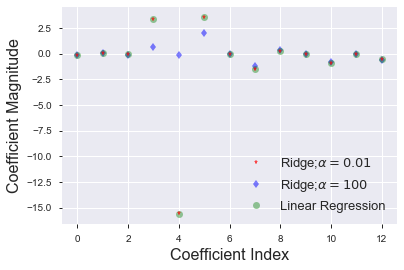

In [108]:
plt.plot(rr.coef_,alpha=0.7,linestyle='none',marker='*',markersize=5,color='red',label=r'Ridge;$\alpha =0.01$',zorder=7)
plt.plot(rr100.coef_,alpha=0.5, linestyle='none',marker='d',markersize=6,color='blue',label=r'Ridge;$\alpha = 100$')
plt.plot(lr.coef_,alpha=0.4,linestyle='none',marker='o',markersize=7,color='green',label='Linear Regression')
plt.xlabel('Coefficient Index',fontsize=16)
plt.ylabel('Coefficient Magnitude',fontsize=16)
plt.legend(fontsize=13,loc=4)
plt.show()

In [111]:
from sklearn.linear_model import LassoCV,RidgeCV,Lasso,Ridge,ElasticNet

In [114]:
Lasso_CV = LassoCV()
Ridge_CV = RidgeCV()
rr = Ridge()
Lo = Lasso()
ENET = ElasticNet()

In [115]:
Lasso_CV.fit(X_train, y_train)
Ridge_CV.fit(X_train, y_train)
rr.fit(X_train,y_train)
Lo.fit(X_train,y_train)
ENET.fit(X_train,y_train)

ElasticNet(alpha=1.0, copy_X=True, fit_intercept=True, l1_ratio=0.5,
           max_iter=1000, normalize=False, positive=False, precompute=False,
           random_state=None, selection='cyclic', tol=0.0001, warm_start=False)

In [116]:
Predict = pd.DataFrame({'Lasso_CV_Pred':Lasso_CV.predict(X_test),
                       'Ridge_CV_Pred':Ridge_CV.predict(X_test),
                       'rr':rr.predict(X_test),
                       'Lo':Lo.predict(X_test),
                       "ENET":ENET.predict(X_test),
                       "Actual_Data":y_test})
Predict

,Lasso_CV_Pred,Ridge_CV_Pred,rr,Lo,ENET,Actual_Data
224,34.165461,37.512145,37.359173,32.741687,33.160036,44.8
137,19.012285,18.782369,18.866498,18.867620,18.551603,17.1
453,20.890408,22.442413,22.787757,19.761237,20.039929,17.8
303,31.529920,32.772475,32.628681,31.053945,31.180279,33.1
254,26.666455,24.283687,24.308022,27.591366,27.295461,21.9
...,...,...,...,...,...,...
434,17.226434,15.827825,16.088877,17.465144,17.427175,11.7
294,23.967263,23.913186,23.414383,24.324897,24.039936,21.7
306,33.259203,35.257217,35.123987,32.428672,32.911099,33.4
463,23.883706,22.435001,22.890544,23.846206,23.922375,20.2


In [69]:
ll = Lasso(alpha=0.01)
ll.fit(X_train, y_train)

Lasso(alpha=0.01, copy_X=True, fit_intercept=True, max_iter=1000,
      normalize=False, positive=False, precompute=False, random_state=None,
      selection='cyclic', tol=0.0001, warm_start=False)

In [70]:
from sklearn.linear_model import LassoCV
alphas2 = np.array([1e-5, 5e-5, 0.0001, 0.0005])
lassoCV = LassoCV(alphas=alphas2,
                 max_iter=5e4,
                 cv=3).fit(X_train, y_train)
lassoCV_rmse = rmse(y_test, lassoCV.predict(X_test))
print(lassoCV.alpha_, lassoCV_rmse) #lasso is slower

1e-05 4.1162146509036


In [71]:
print('Of {} coefficients, {} are non-zero with Lasso.'.format(len(lassoCV.coef_),
                                                              len(lassoCV.coef_.nonzero()[0])))

Of 13 coefficients, 13 are non-zero with Lasso.


# Elastic Net

In [72]:
from sklearn.linear_model import ElasticNetCV
l1_ratios = np.linspace(0.1,0.9,9)
elasticNetCV = ElasticNetCV(alphas=alphas2,
                          l1_ratio=l1_ratios,
                          max_iter=1e4).fit(X_train, y_train)
elasticNetCV_rmse = rmse(y_test,elasticNetCV.predict(X_test))
print(elasticNetCV.alpha_, elasticNetCV.l1_ratio_, elasticNetCV_rmse)

1e-05 0.9 4.116250143871822


In [73]:
alphas2

array([1.e-05, 5.e-05, 1.e-04, 5.e-04])

In [74]:
rmse_vals = [linearRegression_rmse, ridgeCV_rmse, lassoCV_rmse, elasticNetCV_rmse]
labels = ['Linear', 'Ridge', 'Lasso', 'ElasticNet']
rmse_df = pd.Series(rmse_vals, index=labels).to_frame()
rmse_df.rename(columns={0: 'RMSE'}, inplace=1)
rmse_df        # We can also make a plot of actual vs predicted housing prices as before

,RMSE
Linear,306369.683423
Ridge,32169.176206
Lasso,4.116215
ElasticNet,4.116250
